# Notebook 2: Exploration and Findings

In this notebook we dig into the service requests and see what's in there!
In starting this, I had a couple of particular pieces I wanted to look at, but otherwise no particular agenda:
 1. I wanted to see if the number of dog complaints/requests had increased since COVID-19, now that everyone has a COVID dog
 2. I wanted to look into any interesting trends/spikes to see if we could find some related news articles

In [1]:
from datetime import date
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math

In [2]:
reqs = pd.read_pickle('../data/cleaned/requests_all.pkl')
ward_population = pd.read_pickle('../data/cleaned/wards.pkl')

# Some date manipulations
reqs['DATE_RAISED'] = reqs.DATE_RAISED.dt.date
reqs['year'] = reqs.DATE_RAISED.apply(lambda x: x.year)
reqs['year-month'] = reqs.DATE_RAISED.apply(lambda x: str(x.year) + '-' + str(x.month).zfill(2))
reqs['month'] = reqs.DATE_RAISED.apply(lambda x: x.strftime("%B"))
reqs['month raised'] = reqs.DATE_RAISED.apply(lambda x: x.replace(day=1))
reqs['day of year'] = reqs.DATE_RAISED.apply(lambda x: x.strftime("%j"))
                                              

## 1. Requests by day

In [3]:
reqs_daily = (
    reqs
    .groupby(['DATE_RAISED', 'year', 'month', 'day of year'], as_index=False)
    .TYPE.count()
    .rename(columns={'TYPE': 'request count'})
    .sort_values(by='DATE_RAISED')
)
reqs_daily['28 day rolling mean'] = reqs_daily['request count'].rolling(window=28).mean()
reqs_daily['7 day rolling mean'] = reqs_daily['request count'].rolling(window=7).mean()

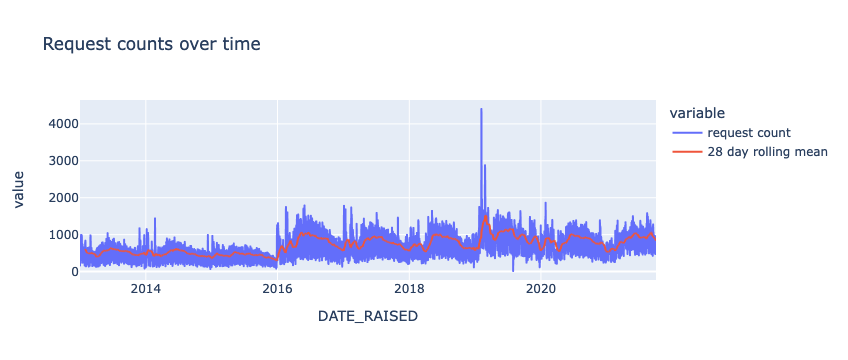

In [4]:
fig = px.line(reqs_daily, x="DATE_RAISED", y=['request count', '28 day rolling mean'], title="Request counts over time")
fig.show()

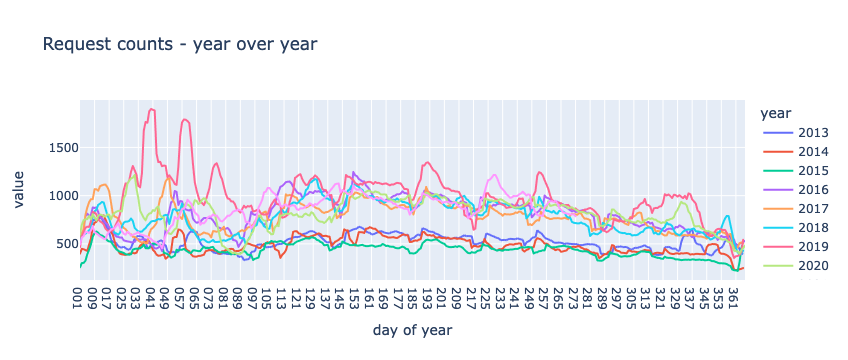

In [5]:
fig = px.line(reqs_daily, x="day of year", y=['7 day rolling mean'], color='year', title='Request counts - year over year')
fig.show()

Notice the clear distinction between the request counts between 2013-2015 and 2016-2021.
My belief is that this is due to a change in data acquisition rather than an actual uptick in requests.  The years 2013-2015 have a very different format, leading me to believe that they come from a different distribution.

In [6]:
print('2013 to 2015 CHANNELS:')
reqs[reqs.year.isin((2013,2014,2015))].CHANNEL.value_counts().reset_index()

2013 to 2015 CHANNELS:


,index,CHANNEL
0,CC PHONE,515028
1,Priority - 3,1448
2,Loretta Yard,1022
3,Priority - 2,859
4,HURDMAN ROADS,809
...,...,...
102,City,1
103,Bell Boxes,1
104,MTO,1
105,City of Ottawa - THURSDAY - Cal. B-APARTMENT Z...,1


In [7]:
print('\n\n\n2016 to 2021 CHANNELS:')
reqs[reqs.year >= 2016].CHANNEL.value_counts().reset_index()




2016 to 2021 CHANNELS:


,index,CHANNEL
0,Voice In,1227298
1,WEB,290853
2,WAP,163919
3,Fax In,48355
4,Face2Face,10320
5,e-mail In,2


... So we see a big difference in input channel for requests.
Moving forward, _we focus on requests from 2016-present_, for (hopefully) more coherent or complete information

In [8]:
reqs = reqs[reqs.year >= 2016]

### 1.a What's up with those outliers in early 2019?

In [9]:
print("Top 5 days by request count")
reqs_daily.sort_values(by='request count', ascending=False).iloc[:5]

Top 5 days by request count


,DATE_RAISED,year,month,day of year,request count,28 day rolling mean,7 day rolling mean
2222,2019-02-05,2019,February,036,4403,1061.035714,1673.428571
2242,2019-02-25,2019,February,056,2880,1481.821429,1619.285714
2243,2019-02-26,2019,February,057,2384,1519.928571,1759.142857
2223,2019-02-06,2019,February,037,2282,1105.357143,1764.714286
2225,2019-02-08,2019,February,039,1953,1168.750000,1874.000000


In [10]:
print('TOP 10 SERVICE REQUEST TYPES ON FEB 5th, 2019:\n')
print(reqs[reqs.DATE_RAISED == date(2019, 2, 5)].groupby('TYPE').SUBJECT.count().sort_values(ascending=False).iloc[:10])
print('\n\nTOP 10 SERVICE REQUEST TYPES ON FEB 25th, 2019:\n')
print(reqs[reqs.DATE_RAISED == date(2019, 2, 25)].groupby('TYPE').SUBJECT.count().sort_values(ascending=False).iloc[:10])

TOP 10 SERVICE REQUEST TYPES ON FEB 5th, 2019:

TYPE
Catchbasin/Maint. Hole | Puisards de Rue/Regard       2154
Road Travelled Surface | Route - Aires de Circulat    1259
Sidewalks/Pathways/Trails | Trottoirs/Sentiers         126
Road Operations General | Opérations Routières Gén      70
Overtime Parking | Stationnement Expiré                 57
Designated Parking | Stationnement Désigné              51
Garbage - SWC | Déchets - CDS                           44
Organics-SWC | Biologiques-CDS                          39
Retail-All Container(80L) | Détaillant-Tous Conten      34
Retail-Black Box | Détaillant-Boîte Noire               30
Name: SUBJECT, dtype: int64


TOP 10 SERVICE REQUEST TYPES ON FEB 25th, 2019:

TYPE
Road Travelled Surface | Route - Aires de Circulat    915
Catchbasin/Maint. Hole | Puisards de Rue/Regard       855
Road Operations General | Opérations Routières Gén     85
Retail-Black Box | Détaillant-Boîte Noire              84
Retail-Blue Box | Détaillant-Boîte Bleue 

... First guess: some sort of manhole theft ring going on in February 2019???
Based on a [Global News Article](https://globalnews.ca/news/4925853/ottawa-flooding-blocked-catch-basins/) and a [CBC News Article](https://www.cbc.ca/news/canada/ottawa/wet-commute-thaw-ottawa-feb-5-2019-1.5006220), it's actually related to flooded streets!!!

## 2. Breakdowns by WARD

/Users/ryanbenty/anaconda3/envs/ottawa_test/lib/python3.8/site-packages/pandas/core/indexing.py:1667: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



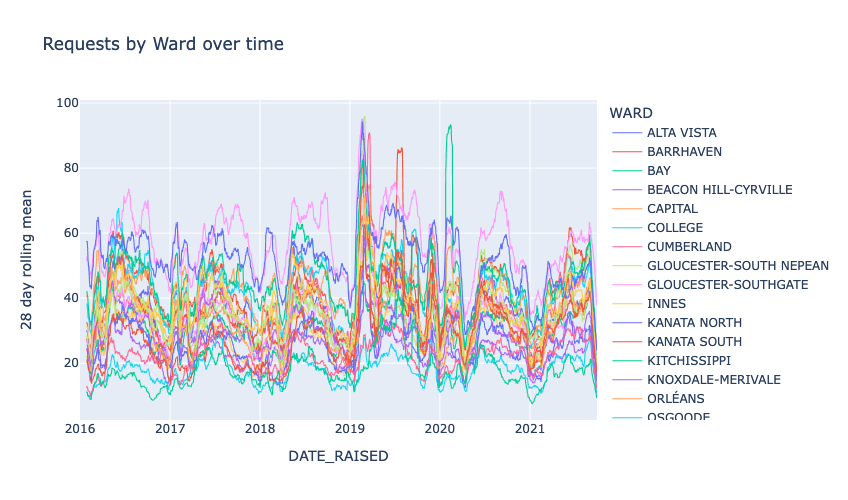

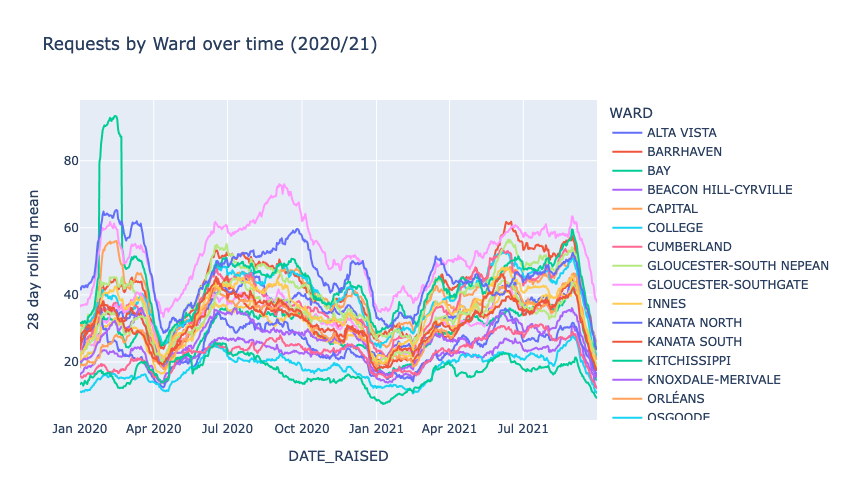

In [11]:
reqs_by_ward = (
    reqs[reqs.year >= 2016]
    .groupby(["DATE_RAISED", "WARD"], as_index=False)
    .TYPE.count()
    .rename(columns={'TYPE': 'request count'})
    .sort_values(by=['WARD', 'DATE_RAISED'])
)
# Remove no-name ward
reqs_by_ward = reqs_by_ward[reqs_by_ward.WARD != ' ']

#Tried to do this with a groupby.rolling but wasn't working for some reason...
ward_list = []
for ward in reqs_by_ward.WARD.unique().tolist():
    df_ward = reqs_by_ward[reqs_by_ward.WARD == ward]
    df_ward.loc[:,'28 day rolling mean'] = df_ward.loc[:,'request count'].rolling(window=28).mean()
    ward_list.append(df_ward)
reqs_by_ward = pd.concat(ward_list)


fig = px.line(reqs_by_ward, x="DATE_RAISED", y='28 day rolling mean', color='WARD', height=500, width=800,
             title='Requests by Ward over time')
fig.update_traces(line={'width': 1.1})
fig.show()

fig = px.line(reqs_by_ward[reqs_by_ward.DATE_RAISED >= date(2020,1,1)], x="DATE_RAISED", y='28 day rolling mean', color='WARD', height=500, width=800,
             title='Requests by Ward over time (2020/21)')
fig.show()

In [12]:
reqs_per_ward = (
    reqs[reqs.year.isin([2016,2017,2018,2019,2020])]
    .groupby('WARD',as_index=False)
    .TYPE.count()
    .rename(columns={'TYPE': 'total requests'})
    .merge(ward_population, on='WARD')
)
reqs_per_ward['avg annual requests'] = (reqs_per_ward['total requests'] / 5).astype(int)
reqs_per_ward['avg annual requests per capita'] = reqs_per_ward['avg annual requests'] / reqs_per_ward.population
reqs_per_ward.sort_values(by='avg annual requests', inplace=True, ascending=False)

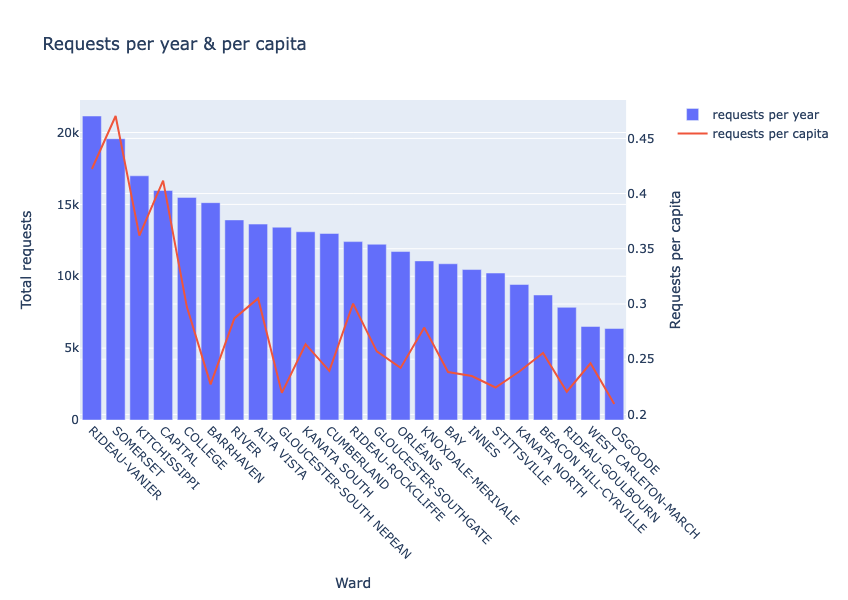

In [13]:

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Bar(x=reqs_per_ward.WARD, y=reqs_per_ward['avg annual requests'], name="requests per year"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=reqs_per_ward.WARD, y=reqs_per_ward['avg annual requests per capita'], name="requests per capita"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Requests per year & per capita",
    height=600
)

# Set x-axis title
fig.update_xaxes(
    title_text="Ward",
    tickangle=45
)

# Set y-axes titles
fig.update_yaxes(title_text="Total requests", secondary_y=False)
fig.update_yaxes(title_text="Requests per capita", secondary_y=True)

fig.show()

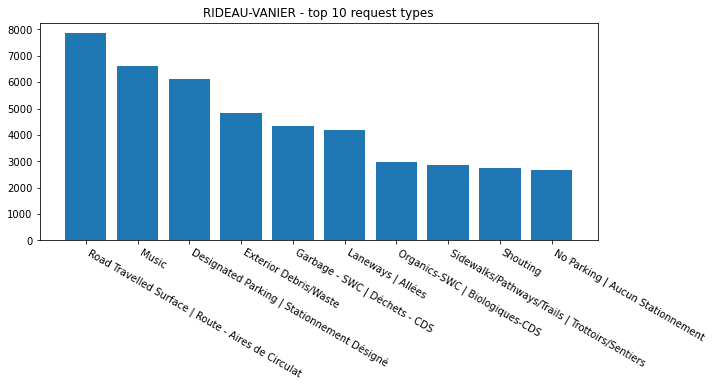

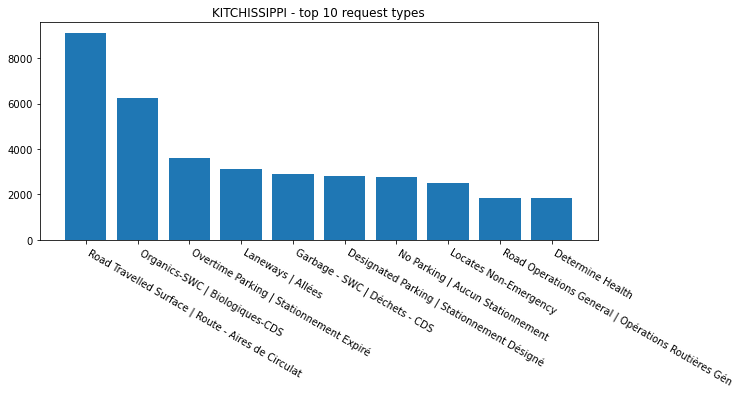

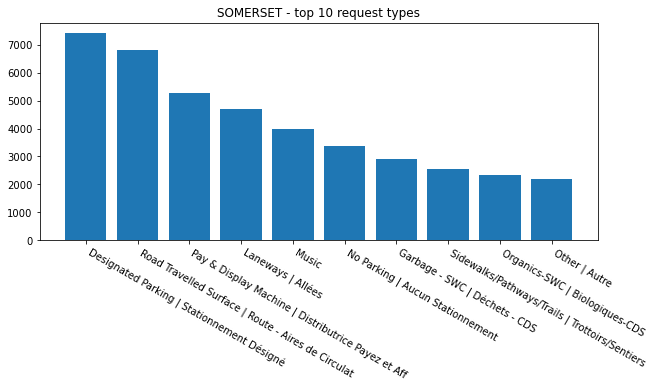

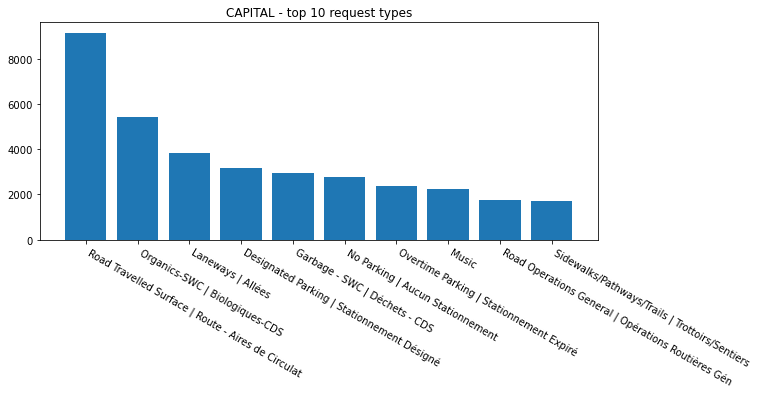

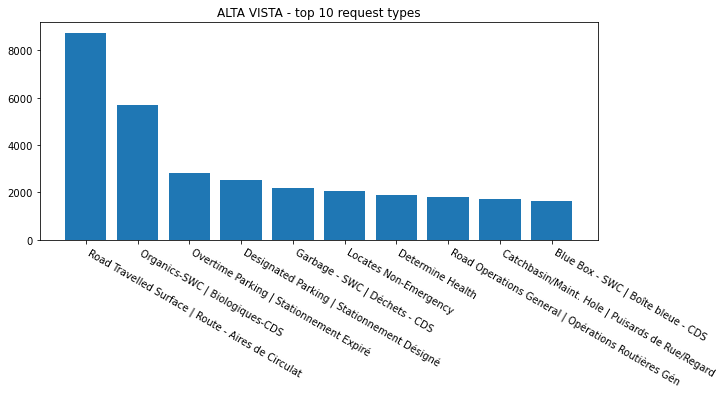

...

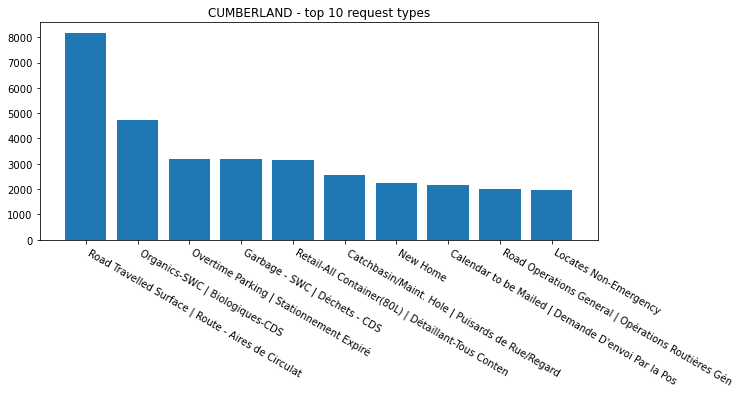

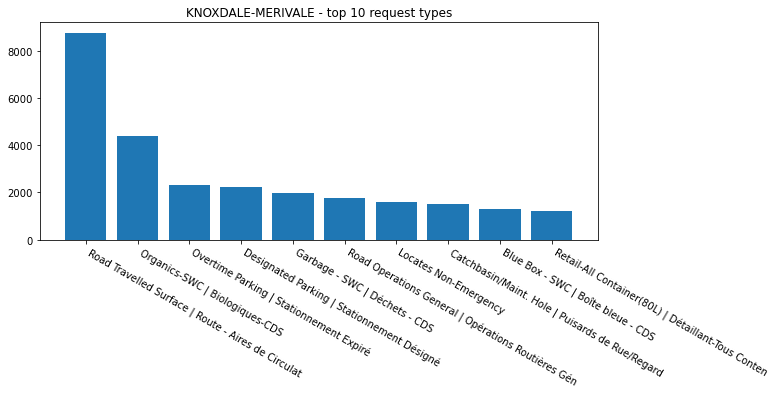

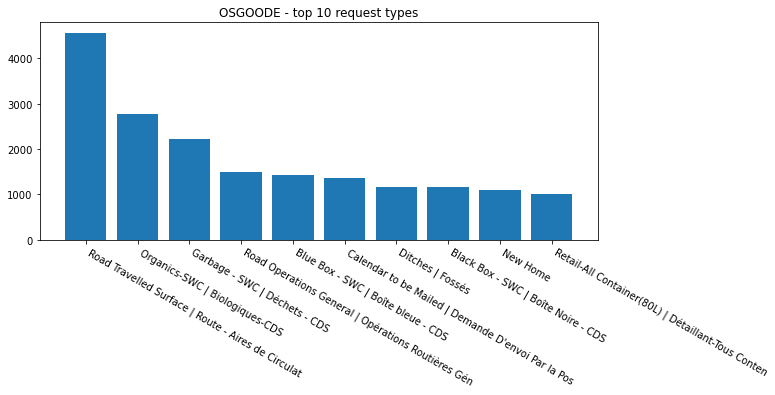

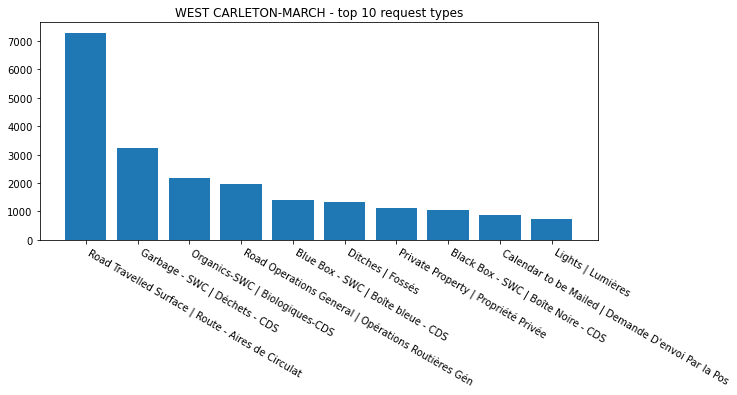

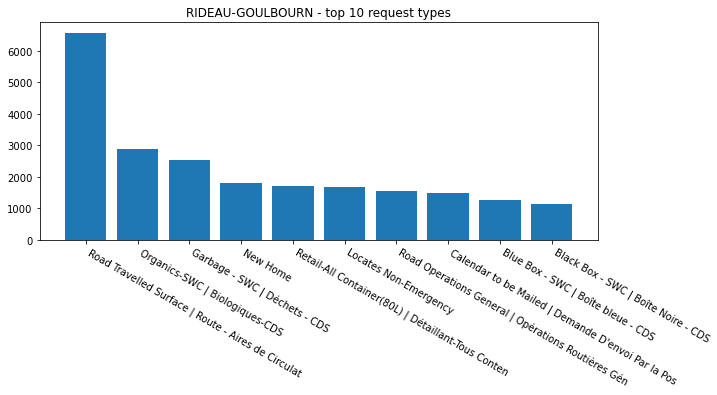

In [14]:
for ward in reqs.WARD.unique().tolist():
    if ward == ' ' or str(ward) == 'nan':
        continue
    reqs_ward = reqs[reqs.WARD == ward]
    reqs_ward = reqs_ward.groupby(['TYPE'], as_index=False).CHANNEL.count().rename(columns={'CHANNEL':'request count'})
    reqs_ward.sort_values(by=['request count'], ascending=False, inplace=True)
    # Top 10 reqests
    reqs_ward = reqs_ward.iloc[:10,:]
    plt.figure(figsize=(10,4))
    plt.bar(reqs_ward['TYPE'], reqs_ward['request count'])
    plt.xticks(rotation=-30, ha='left')
    plt.title(f'{ward} - top 10 request types')
    plt.show()

#### Random thought - what are the pairwise Bhattacharyya distances between wards?
ie. Which wards are the most "similar" in their request type distributions?

In [15]:
distance_list = []
reqs_by_w_t = reqs.groupby(['TYPE', 'WARD'], as_index=False).DATE_RAISED.count().rename(columns={'DATE_RAISED': 'request count'})
# encode each "type" with an integer value
type_ord = pd.Series(reqs_by_w_t.TYPE.unique()).reset_index().rename(columns={'index': 'TYPE_ord', 0:'TYPE'})
reqs_by_w_t = reqs_by_w_t.merge(type_ord, on='TYPE')
# convert requeset counts into distributions per ward
reqs_by_w_t['request dist'] = reqs_by_w_t['request count'] / reqs_by_w_t.groupby('WARD')['request count'].transform(lambda x: x.sum())
ward_names = sorted(reqs_by_w_t.WARD.unique().tolist())
for ix1, ward1 in enumerate(ward_names):
    for ix2, ward2 in enumerate(ward_names):
        if ix2 <= ix1 or ward1 == ' ' or ward2 == ' ':
            continue
        req_dist1 = reqs_by_w_t[reqs_by_w_t.WARD == ward1][['WARD','TYPE','request dist']].rename(columns={'WARD': 'ward1', 'request dist': 'dist1'})
        req_dist2 = reqs_by_w_t[reqs_by_w_t.WARD == ward2][['WARD','TYPE','request dist']].rename(columns={'WARD': 'ward2', 'request dist': 'dist2'})
        dists_combined = req_dist1.merge(req_dist2, on='TYPE', how='outer').fillna(0)
        dists_combined['sqrt_product'] = np.sqrt(dists_combined['dist1']*dists_combined['dist2'])
        distance_dict = {
            'ward1': ward1, 
            'ward2': ward2, 
            'BC_distance': -np.log(dists_combined['sqrt_product'].sum())
        }
        distance_list.append(distance_dict)
        # print(req_dist1.merge(req_dist2, on='TYPE', how='outer'))

distances = pd.DataFrame(distance_list).sort_values(by='BC_distance')

In [16]:
distances

,ward1,ward2,BC_distance
27,BARRHAVEN,GLOUCESTER-SOUTH NEPEAN,0.008003
175,KANATA NORTH,KANATA SOUTH,0.008617
166,INNES,ORLÉANS,0.009224
18,ALTA VISTA,RIVER,0.010629
89,CAPITAL,KITCHISSIPPI,0.011085
...,...,...,...
250,SOMERSET,STITTSVILLE,0.238398
246,RIDEAU-VANIER,WEST CARLETON-MARCH,0.267927
235,RIDEAU-GOULBOURN,SOMERSET,0.282713
229,OSGOODE,SOMERSET,0.308677


Interesting! Barrhaven and Gloucester-South Nepean are neighbouring suburban neighbourhoods, as are Kanata North and Kanata South, whereas Somerset and West Carleton-March are on nearly complete opposite ends.  So this distance does seem to measure some valid differences.

# By request type - time trends

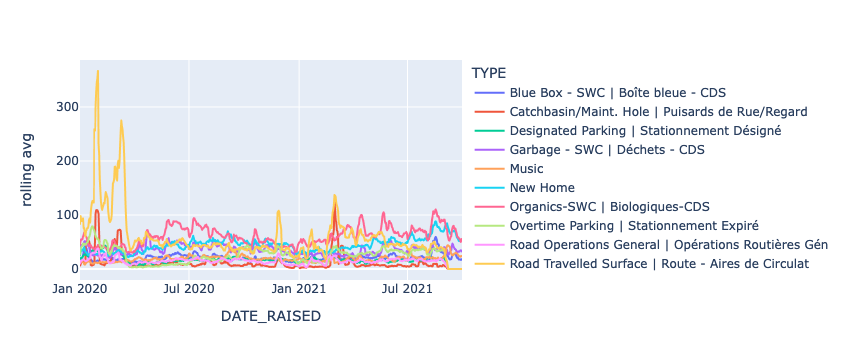

In [17]:
top_ten_reqs = reqs.groupby('TYPE').TYPE.count().sort_values(ascending=False).iloc[:12]
reqs_in_top10 = reqs[reqs.TYPE.isin(top_ten_reqs.index.tolist())]
reqs_by_day_top10 = reqs_in_top10.groupby(['DATE_RAISED', 'TYPE'], as_index=False).CHANNEL.count().rename(columns={'CHANNEL': 'request count'}).sort_values(by=['TYPE','DATE_RAISED']).reset_index(drop=True)
reqs_by_day_top10['rolling avg'] = reqs_by_day_top10.groupby('TYPE')['request count'].rolling(7).mean().reset_index(drop=True).tolist()
reqs_by_day_top10 = reqs_by_day_top10[reqs_by_day_top10.DATE_RAISED >= date(2020,1,1)]
fig = px.line(reqs_by_day_top10, x="DATE_RAISED", y='rolling avg', color='TYPE')
fig.show()

# Dogs

Was there a spike in dog-related calls since COVID?

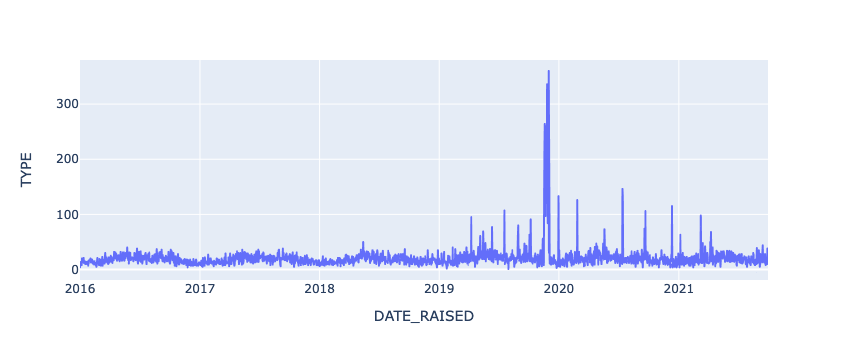

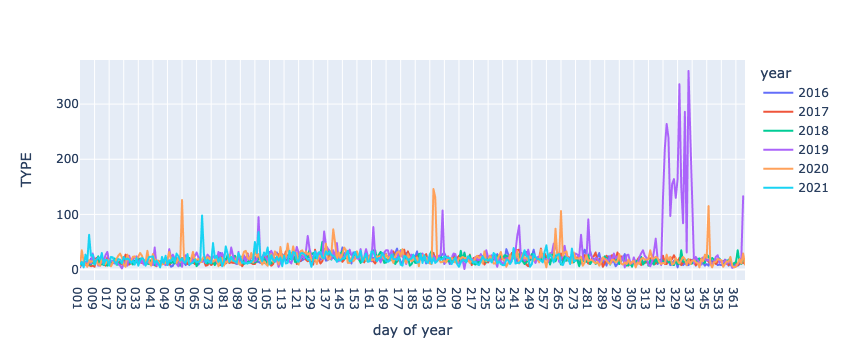

In [18]:
reqs_dog = reqs[reqs.TYPE.str.lower().str.contains('dog|pit bull')]
reqs_dog_daily = reqs_dog.groupby(['DATE_RAISED','day of year','year'], as_index=False).TYPE.count()
fig = px.line(reqs_dog_daily, x="DATE_RAISED", y='TYPE')
fig.show()
fig = px.line(reqs_dog_daily, x="day of year", y='TYPE', color='year')
fig.show()

... hmmm, there is a spike but that's more at the end of 2019... What's up with that?
Let's break down by request type

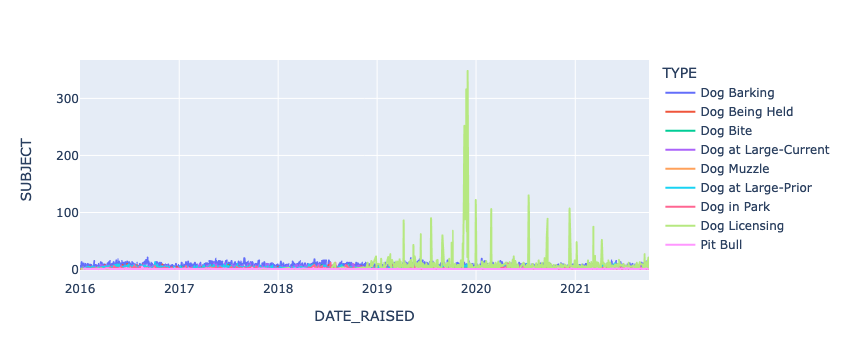

In [19]:
reqs_dog_daily_type = reqs_dog.groupby(['DATE_RAISED','day of year','year', 'TYPE'], as_index=False).SUBJECT.count()
fig = px.line(reqs_dog_daily_type, x="DATE_RAISED", y='SUBJECT', color='TYPE')
fig.show()

... Well, that doesn't seem to be covid related.

# By Subject

[Apparently](https://www.cbc.ca/news/canada/ottawa/bylaw-calls-2020-2021-1.6125541), bylaw service calls have been up since COVID.  What about other subjects?

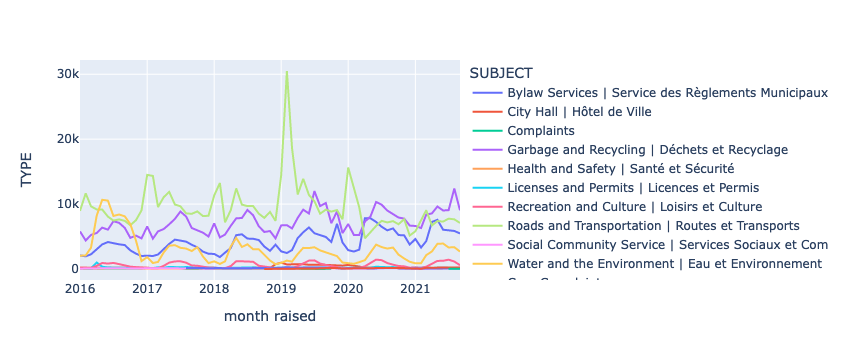

In [20]:
fig = px.line(reqs.groupby(['month raised', 'SUBJECT'],as_index=False).TYPE.count(), x='month raised', y='TYPE', color='SUBJECT')
fig.show()

... Hmmm.  It's true that Bylaw requests are up, but they've been increasing year over year since 2016!

# By input Channel

How are people making requests?

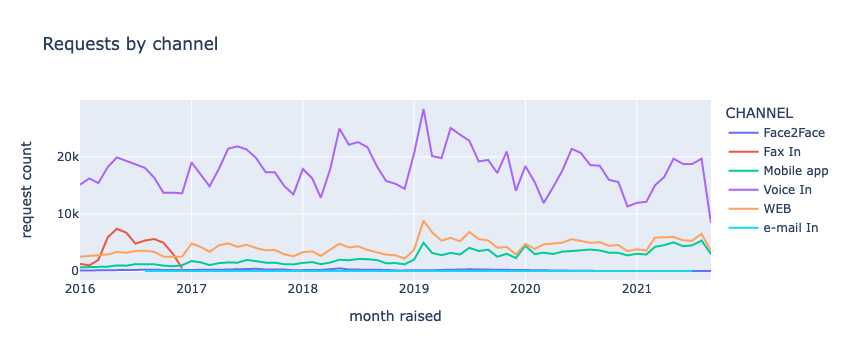

In [21]:
# WAP = Wireless application protocol (aka mobile app)
reqs.loc[:,'CHANNEL'] = reqs['CHANNEL'].str.replace('WAP', 'Mobile app')
reqs_by_day_channel = reqs.groupby(['month raised', 'CHANNEL'], as_index=False).agg({'SUBJECT': 'count'}).rename(columns={'SUBJECT': 'request count'})
fig = px.line(reqs_by_day_channel, x="month raised", y='request count', color='CHANNEL', title='Requests by channel')
fig.show()


### Random - incomplete musings

In [23]:
# from https://www.ibm.com/docs/en/cognos-analytics/11.1.0?topic=terms-modified-z-score
def modified_z_score(x):
    if x.MAD == 0:
        return (x['request count'] - x.med) / (1.253314*x.MeanAD + 1e-5) # add small value to prevent division by zero
    else:
        return (x['request count'] - x.med) / (1.486*x.MAD + 1e-5) # add small value to prevent division by zero

In [24]:
# Outlier detection
reqs_by_day_type = reqs.groupby(['DATE_RAISED', 'TYPE'], as_index=False).SUBJECT.count().rename(columns={'SUBJECT': 'request count'})
reqs_by_type_stats = reqs_by_day_type.groupby('TYPE', as_index=False).agg({'request count': ['sum', 'mean', 'std', 'median', lambda x: np.quantile(x, .95), lambda x: np.quantile(x, .99), lambda x: np.abs(x-x.median()).median(), lambda x: np.abs(x-x.mean()).median()]})
reqs_by_type_stats.columns = ['TYPE', 'sum', 'avg', 'stddev', 'med', 'pct_95', 'pct_99', 'MAD','MeanAD']
reqs_by_day_type_stats = reqs_by_day_type.merge(reqs_by_type_stats, on='TYPE')
reqs_by_day_type_stats['z_score'] = (reqs_by_day_type_stats['request count']-reqs_by_day_type_stats.avg )/(reqs_by_day_type_stats.stddev + .001)
reqs_by_day_type_stats['modified_z_score'] = reqs_by_day_type_stats.apply(lambda x: modified_z_score(x), axis=1)
reqs_by_day_type_stats.sort_values(by='modified_z_score', ascending=False)

,DATE_RAISED,TYPE,request count,sum,avg,stddev,med,pct_95,pct_99,MAD,MeanAD,z_score,modified_z_score
13706,2019-02-05,Catchbasin/Maint. Hole | Puisards de Rue/Regard,2154,33325,16.489362,66.301341,7.0,47.0,200.0,4.0,10.489362,32.238841,361.203968
218348,2018-12-20,Unauthorized Activities,381,4744,4.664700,23.076274,2.0,6.0,72.2,1.0,2.664700,16.307615,255.045390
218349,2018-12-21,Unauthorized Activities,288,4744,4.664700,23.076274,2.0,6.0,72.2,1.0,2.664700,12.277676,192.461693
13725,2019-02-24,Catchbasin/Maint. Hole | Puisards de Rue/Regard,1036,33325,16.489362,66.301341,7.0,47.0,200.0,4.0,10.489362,15.376691,173.115456
159513,2017-10-30,Drain Trouble Basement Flooding,256,4438,2.602933,6.719139,2.0,6.0,9.0,1.0,1.397067,37.707120,170.927517
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18178,2021-04-02,Designated Parking | Stationnement Désigné,4,46529,22.188364,8.231114,22.0,36.0,46.0,5.0,5.188364,-2.209440,-2.422608
17886,2020-06-14,Designated Parking | Stationnement Désigné,3,46529,22.188364,8.231114,22.0,36.0,46.0,5.0,5.188364,-2.330916,-2.557197
17823,2020-04-12,Designated Parking | Stationnement Désigné,2,46529,22.188364,8.231114,22.0,36.0,46.0,5.0,5.188364,-2.452391,-2.691786
16622,2016-12-25,Designated Parking | Stationnement Désigné,2,46529,22.188364,8.231114,22.0,36.0,46.0,5.0,5.188364,-2.452391,-2.691786


In [25]:
reqs_by_type = reqs.groupby('TYPE',as_index=False).SUBJECT.count().rename(columns={'SUBJECT': 'request count'})
reqs_by_type.sort_values(by='request count', ascending=False, inplace=True)
reqs_by_type['pct of total requests'] = reqs_by_type['request count'] / reqs_by_type['request count'].sum()
reqs_by_type['cumulative pct of total requests'] = reqs_by_type['pct of total requests'].cumsum()
reqs_by_type

,TYPE,request count,pct of total requests,cumulative pct of total requests
398,Road Travelled Surface | Route - Aires de Circ...,165221,9.432032e-02,0.094320
298,Organics-SWC | Biologiques-CDS,105905,6.045838e-02,0.154779
178,Garbage - SWC | Déchets - CDS,65763,3.754237e-02,0.192321
311,Overtime Parking | Stationnement Expiré,61449,3.507962e-02,0.227401
255,Locates Non-Emergency,47477,2.710337e-02,0.254504
...,...,...,...,...
65,Capital Maintenance Plan,1,5.708737e-07,0.999998
492,Unauthorized Material,1,5.708737e-07,0.999998
332,Permit,1,5.708737e-07,0.999999
503,Waste Receptacle,1,5.708737e-07,0.999999


In [26]:
reqs

,SUBJECT,REASON,TYPE,DATE_RAISED,CHANNEL,WARD,year,year-month,month,month raised,day of year
0,Bylaw Services | Service des Règlements Munici...,Bylaw Services | Service des Règlements Munici...,Curbside Collection | Collecte en bordure de rue,2019-01-20,Voice In,RIDEAU-VANIER,2019,2019-01,January,2019-01-01,020
1,Bylaw Services | Service des Règlements Munici...,Bylaw Services | Service des Règlements Munici...,Graffiti,2019-01-03,WEB,KITCHISSIPPI,2019,2019-01,January,2019-01-01,003
2,Bylaw Services | Service des Règlements Munici...,Bylaw Services | Service des Règlements Munici...,Graffiti,2019-01-03,WEB,KITCHISSIPPI,2019,2019-01,January,2019-01-01,003
3,Bylaw Services | Service des Règlements Munici...,Bylaw Services | Service des Règlements Munici...,Graffiti,2019-01-07,WEB,KITCHISSIPPI,2019,2019-01,January,2019-01-01,007
4,Bylaw Services | Service des Règlements Munici...,Bylaw Services | Service des Règlements Munici...,Graffiti,2019-01-08,WEB,KITCHISSIPPI,2019,2019-01,January,2019-01-01,008
...,...,...,...,...,...,...,...,...,...,...,...
297639,Water and the Environment | Eau et Environnement,Water Turn On/Off,Water Turn On/Off,2020-12-30,Voice In,RIDEAU-ROCKCLIFFE,2020,2020-12,December,2020-12-01,365
297640,Water and the Environment | Eau et Environnement,Water Turn On/Off,Water Turn On/Off,2020-12-30,Voice In,RIVER,2020,2020-12,December,2020-12-01,365
297641,Water and the Environment | Eau et Environnement,Water Turn On/Off,Water Turn On/Off,2020-12-30,Voice In,ALTA VISTA,2020,2020-12,December,2020-12-01,365
297642,Water and the Environment | Eau et Environnement,Water Turn On/Off,Water Turn On/Off,2020-12-31,Voice In,SOMERSET,2020,2020-12,December,2020-12-01,366
